<a href="https://colab.research.google.com/github/vishnushukla1729/Deep-learning-project/blob/main/Finetuning_ViT_multilabel_image_classification_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this [experiment](Finetuning-ViT-multilabel-image-classification.ipynb), fine-tuned a Swin Transformer model, specifically `swin_s3_base_224` from the `timm` library, for multi-label image classification using the Pascal VOC 2007 dataset, achieving an improvement in validation ROC AUC from 72% to 99% after just 5 epochs. (I followed the data preprocessing and training steps in this [tutorial](https://colab.research.google.com/github/johko/computer-vision-course/blob/main/notebooks/Unit%203%20-%20Vision%20Transformers/fine-tuning-multilabel-image-classification.ipynb#scrollTo=7c64af09), but wrote my own scripts.)

The Swin Transformer is a variant of the Vision Transformer (ViT) designed to overcome some of the limitations of the original ViT, such as the fixed size of input patches.

This quick convergence was only possible with learning rate of 2e-4. I experimented with other different learning rates, at which the model would not converge to an acceptable ROC AUC, even at the learning rate of 5e-4 which appears quite close to the 2e-4 learning rate.

The model was fine-tuned using a cosine learning rate schedule, and performance is evaluated using metrics like ROC AUC, calculated via Hugging Face's `evaluate` library.

![loss_plot1.png](loss_plot1.png)

![roc_auc_plot1.png](roc_auc_plot1.png)

![predictions.png](predictions.png)

In [2]:
import numpy as np
import torch


# so that the representation of a tensor in debugging includes the shape
normal_repr = torch.Tensor.__repr__
torch.Tensor.__repr__ = lambda self: f"{self.shape}_{normal_repr(self)}"


# Loading & previewing the dataset

In [4]:
!pip install -Uq transformers datasets timm accelerate evaluate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 95.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 39.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torchvision.transforms as T

from pathlib import Path
from PIL import Image

import datasets

from transformers.optimization import get_cosine_schedule_with_warmup

from timm import list_models, create_model

from accelerate import Accelerator, notebook_launcher

import evaluate

In [6]:
from datasets import load_dataset

dataset_id = "fuliucansheng/pascal_voc"
model_checkpoint = "swin_s3_base_224"

dataset_original = load_dataset(dataset_id, name="voc2007_main")
dataset_original

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


pascal_voc.py:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

The repository for fuliucansheng/pascal_voc contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/fuliucansheng/pascal_voc.
You can avoid this prompt in future by passing the argument `trust_remote_code=True`.

Do you wish to run the custom code? [y/N] y


voc2007.tar.gz:   0%|          | 0.00/878M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating validation split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['id', 'image', 'height', 'width', 'classes', 'objects'],
        num_rows: 2501
    })
    validation: Dataset({
        features: ['id', 'image', 'height', 'width', 'classes', 'objects'],
        num_rows: 2510
    })
    test: Dataset({
        features: ['id', 'image', 'height', 'width', 'classes', 'objects'],
        num_rows: 4952
    })
})

In [7]:
class_names = [
    "Aeroplane","Bicycle","Bird","Boat","Bottle",
    "Bus","Car","Cat","Chair","Cow","Diningtable",
    "Dog","Horse","Motorbike","Person",
    "Potted plant","Sheep","Sofa","Train","Tv/monitor"
]

In [8]:
label2id = {label: i for i, label in enumerate(class_names)}
id2label = {i: label for i, label in enumerate(class_names)}

In [9]:
dataset_original["train"].features

{'id': Value(dtype='int32', id=None),
 'image': Image(mode=None, decode=True, id=None),
 'height': Value(dtype='int32', id=None),
 'width': Value(dtype='int32', id=None),
 'classes': Sequence(feature=Value(dtype='int32', id=None), length=-1, id=None),
 'objects': Sequence(feature={'bboxes': Sequence(feature=Value(dtype='float32', id=None), length=-1, id=None), 'classes': ClassLabel(names=['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor', 'background', 'borderingregion'], id=None), 'difficult': Value(dtype='int32', id=None)}, length=-1, id=None)}

In [10]:
# some testing
','.join([id2label[class_id] for class_id in dataset_original["train"][1]['classes']])


'Person,Horse'

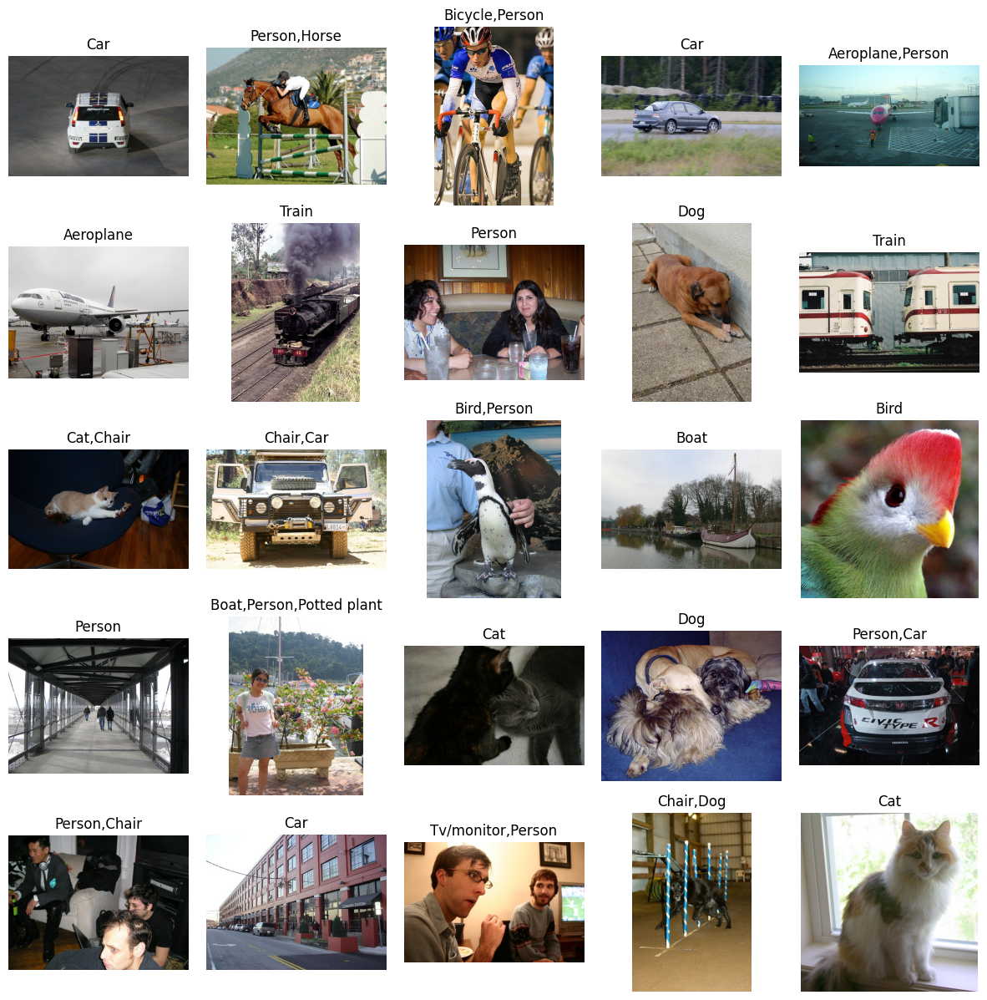

In [11]:
import matplotlib.pyplot as plt
from PIL import Image

rows, cols = 5, 5

def preview_images(dataset, rows=4, cols=4, labels=None):
    fig = plt.figure(figsize=(rows * 3, cols * 3))
    plt.subplots_adjust(wspace=0.1, hspace=0.1)

    for i in range(rows * cols):
        ax = fig.add_subplot(rows, cols, i+1)
        ax.imshow(dataset[i]["image"])
        if labels is None:
            label = ','.join([id2label[class_id] for class_id in dataset_original["train"][i]['classes']])
        else:
            label = labels[i]
        ax.set_title(label)
        ax.axis("off")

preview_images(dataset_original["train"], rows, cols)


In [12]:
dataset_original["train"].features

{'id': Value(dtype='int32', id=None),
 'image': Image(mode=None, decode=True, id=None),
 'height': Value(dtype='int32', id=None),
 'width': Value(dtype='int32', id=None),
 'classes': Sequence(feature=Value(dtype='int32', id=None), length=-1, id=None),
 'objects': Sequence(feature={'bboxes': Sequence(feature=Value(dtype='float32', id=None), length=-1, id=None), 'classes': ClassLabel(names=['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor', 'background', 'borderingregion'], id=None), 'difficult': Value(dtype='int32', id=None)}, length=-1, id=None)}

In [13]:
import torchvision.transforms as transforms
from PIL import Image

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=30),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[.485, .456, .406,], std=[.229, .224, .225]),
])

valid_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    # transforms.RandomHorizontalFlip(p=0.5),
    # transforms.RandomRotation(degrees=30),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[.485, .456, .406,], std=[.229, .224, .225]),
])

In [14]:
from datasets import DatasetDict
dataset_mini = DatasetDict({
    "train": dataset_original["train"],  # .select(range(10)),
    "valid": dataset_original["validation"],  #.select(range(2)),
    }
)
dataset_mini

DatasetDict({
    train: Dataset({
        features: ['id', 'image', 'height', 'width', 'classes', 'objects'],
        num_rows: 2501
    })
    valid: Dataset({
        features: ['id', 'image', 'height', 'width', 'classes', 'objects'],
        num_rows: 2510
    })
})

In [15]:
dataset_train = dataset_mini["train"]
dataset_valid = dataset_mini["valid"]

In [16]:
def process_dataset_train(batch):
    batch["image"] = [image.convert("RGB") for image in batch["image"]]
    batch["pixel_values"] = [train_transform(image) for image in batch["image"]]
    batch["labels"] = [torch.nn.functional.one_hot(torch.LongTensor(class_list), num_classes=20).sum(axis=0) for class_list in batch["classes"]]
    return batch


def process_dataset_valid(batch):
    batch["image"] = [image.convert("RGB") for image in batch["image"]]
    batch["pixel_values"] = [valid_transform(image) for image in batch["image"]]
    batch["labels"] = [torch.nn.functional.one_hot(torch.LongTensor(class_list), num_classes=20).sum(axis=0) for class_list in batch["classes"]]
    return batch


In [17]:

dataset_train_w_transform = dataset_train.with_transform(process_dataset_train)
dataset_valid_w_transform = dataset_valid.with_transform(process_dataset_valid)

In [18]:

def collate_fn(batch):
    collated = {
        "pixel_values": torch.stack([example["pixel_values"] for example in batch]),
        "labels": torch.stack([example["labels"] for example in batch])
    }
    return collated

# Set up the data loader

In [19]:
batch_size = 32

train_loader = torch.utils.data.DataLoader(
    dataset_train_w_transform,
    batch_size=batch_size,
    # shuffle=True,
    collate_fn=collate_fn
)

valid_loader = torch.utils.data.DataLoader(
    dataset_valid_w_transform,
    batch_size=batch_size,
    shuffle=False,
    collate_fn=collate_fn,
)

# Set up the model

In [20]:
from timm import create_model

device = 'cuda' if torch.cuda.is_available() else 'cpu'
# device = 'cpu'
model = create_model(
    model_checkpoint,
    pretrained=True,
    num_classes=20
).to(device)
print(f"Using: {device}")

model.safetensors:   0%|          | 0.00/295M [00:00<?, ?B/s]

Using: cuda


In [21]:
model2 = model

In [22]:
# let's count number of params
def param_count(model):
    params = [(p.numel(), p.requires_grad) for p in model.parameters()]
    trainable = sum([count for count, trainable in params if trainable])
    total = sum([count for count, _ in params])
    frac = (trainable / total) * 100
    return total, trainable, frac

In [23]:
print(param_count(model))

(70372142, 70372142, 100.0)


## Testing the model pre-finetuning (should get poorer performance)

In [39]:
import torch
import numpy as np
import evaluate

model.eval()
metric = evaluate.load("roc_auc", "multilabel")

with torch.no_grad():
    for batch in valid_loader:
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        outputs = model(pixel_values)
        metric.add_batch(prediction_scores=outputs.cpu().numpy(), references=labels.cpu().numpy())

roc_auc = metric.compute()
print(f"Validation ROC AUC: {roc_auc}")

image_index = 0
example = dataset_valid_w_transform[image_index]
image = example['pixel_values'].unsqueeze(0).to(device)

with torch.no_grad():
    output = model(image)
    prediction = torch.sigmoid(output)


predicted_classes = (prediction > 0.5).squeeze().cpu().numpy()
print(f"Predicted Classes (indices): {np.where(predicted_classes == 1)[0]}")

print(f"Predicted Classes (names): {[id2label[i] for i in np.where(predicted_classes == 1)[0]]}")

Validation ROC AUC: {'roc_auc': 0.988887326098973}
Predicted Classes (indices): [ 8 10 14]
Predicted Classes (names): ['Chair', 'Diningtable', 'Person']


In [43]:
from tqdm.auto import tqdm
import evaluate

metric = evaluate.load("roc_auc", "multilabel")

model.eval()
for batch in tqdm(valid_loader):
    batch = {k: v.to(device) for k, v in batch.items()}
    with torch.no_grad():

        outputs = model(batch["pixel_values"])


    metric.add_batch(prediction_scores=outputs.cpu().numpy(), references=batch["labels"].cpu().numpy())

metric.compute()

  0%|          | 0/79 [00:00<?, ?it/s]

{'roc_auc': 0.988887326098973}

# Training


## Set-up: optimizer, lr scheduler, logging/eval params

In [45]:
import tqdm
from transformers import get_cosine_schedule_with_warmup

optimizer = torch.optim.AdamW(params=model2.parameters(), lr=2e-4, weight_decay=0.02)

num_epochs = 5
gradient_accumulation_batches = 1
logging_steps = 25
eval_steps = 60

# each "step" consists of several batches that were accumulated
total_training_steps = len(train_loader) // gradient_accumulation_batches * num_epochs

lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=int(0.1 * len(train_loader)),
    num_training_steps=total_training_steps
)

loss_fn = torch.nn.BCEWithLogitsLoss()

## Training loop

In [25]:
import evaluate

train_metric = evaluate.load('roc_auc', 'multilabel')
completed_steps = 0
currently_accumulated_losses = []
array_train_roc_auc = []
array_val_roc_auc = []
array_train_loss = []
array_val_loss = []

with tqdm.tqdm(desc="Training progress",
               total=total_training_steps,
               unit="steps") as pbar:
    for epoch in range(0, 0 + num_epochs):
        for batch_idx, batch in enumerate(train_loader):
            # pass the inputs through the model
            model.train()
            logits = model(batch["pixel_values"].to(device))
            loss_this_batch = loss_fn(logits, batch["labels"].float().to(device))

            # backward pass
            loss_this_batch.backward()
            # save the loss value to the currently-accumulated array
            currently_accumulated_losses.append(loss_this_batch)

            train_metric.add_batch(references=batch["labels"], prediction_scores=logits)

            # if logging step:
            if (batch_idx + 1) % (gradient_accumulation_batches * logging_steps) == 0:
                accumulated_loss = torch.stack(currently_accumulated_losses).mean().item()
                print({
                    "completed_steps": completed_steps,
                    "train loss (last accumulation)": accumulated_loss
                }, "\n")
                # array_train_loss.append( (completed_steps, accumulated_loss) )

            # if accumulation step: update the optimizer, scheduler, "completed_steps" value, update progress bar
            if (batch_idx + 1) % gradient_accumulation_batches == 0:
                optimizer.step()
                optimizer.zero_grad()
                lr_scheduler.step()
                completed_steps += 1
                pbar.update(1)
                accumulated_loss = torch.stack(currently_accumulated_losses).mean().item()
                array_train_loss.append( (completed_steps, accumulated_loss) )
                currently_accumulated_losses = []

            # if eval step:
            if (batch_idx + 1) % (gradient_accumulation_batches * eval_steps) == 0:
                val_loss = 0
                val_metric = evaluate.load('roc_auc', 'multilabel')
                # validation loop
                for batch_idx, eval_batch in enumerate(valid_loader):
                    model.eval()
                    with torch.no_grad():
                        val_logits = model(eval_batch["pixel_values"].to(device))
                    val_loss_this_batch = loss_fn(val_logits, eval_batch["labels"].float().to(device))
                    val_loss += val_loss_this_batch.item()
                    val_metric.add_batch(references=eval_batch["labels"], prediction_scores=val_logits)

                avg_val_loss = val_loss / len(valid_loader)
                val_roc_auc = val_metric.compute(average='micro')['roc_auc']
                print({
                    "completed_steps": completed_steps,
                    "val loss": avg_val_loss,
                    "val ROC AUC": val_roc_auc,
                }, "\n")
                array_val_loss.append( (completed_steps, avg_val_loss) )
                array_val_roc_auc.append( (completed_steps, val_roc_auc) )

        train_roc_auc = train_metric.compute(average='micro')['roc_auc']
        print(f"Epoch {epoch+1}. Train_roc_auc: {train_roc_auc}")
        array_train_roc_auc.append( (completed_steps, train_roc_auc) )


Training progress:   6%|▋         | 25/395 [00:32<07:20,  1.19s/steps]

{'completed_steps': 24, 'train loss (last accumulation)': 0.22521467506885529} 



Training progress:  13%|█▎        | 50/395 [01:02<07:19,  1.27s/steps]

{'completed_steps': 49, 'train loss (last accumulation)': 0.2172347605228424} 



Training progress:  15%|█▌        | 60/395 [01:15<07:09,  1.28s/steps]

{'completed_steps': 60, 'val loss': 0.2144094145373453, 'val ROC AUC': 0.7700548553868842} 



Training progress:  19%|█▉        | 75/395 [02:24<07:27,  1.40s/steps]

{'completed_steps': 74, 'train loss (last accumulation)': 0.1754566729068756} 



Training progress:  20%|██        | 79/395 [02:28<05:13,  1.01steps/s]

Epoch 1. Train_roc_auc: 0.7115551113879024


Training progress:  26%|██▋       | 104/395 [03:01<06:20,  1.31s/steps]

{'completed_steps': 103, 'train loss (last accumulation)': 0.11691611260175705} 



Training progress:  33%|███▎      | 129/395 [03:34<05:45,  1.30s/steps]

{'completed_steps': 128, 'train loss (last accumulation)': 0.09909405559301376} 



Training progress:  35%|███▌      | 139/395 [03:47<05:32,  1.30s/steps]

{'completed_steps': 139, 'val loss': 0.07562671351847769, 'val ROC AUC': 0.9814465863783806} 



Training progress:  39%|███▉      | 154/395 [04:51<05:34,  1.39s/steps]

{'completed_steps': 153, 'train loss (last accumulation)': 0.05968571454286575} 



Training progress:  40%|████      | 158/395 [04:55<03:53,  1.01steps/s]

Epoch 2. Train_roc_auc: 0.9519752796144697


Training progress:  46%|████▋     | 183/395 [05:28<04:36,  1.31s/steps]

{'completed_steps': 182, 'train loss (last accumulation)': 0.04386148974299431} 



Training progress:  53%|█████▎    | 208/395 [06:00<04:01,  1.29s/steps]

{'completed_steps': 207, 'train loss (last accumulation)': 0.0442485436797142} 



Training progress:  55%|█████▌    | 218/395 [06:13<03:49,  1.29s/steps]

{'completed_steps': 218, 'val loss': 0.05660915855742708, 'val ROC AUC': 0.9890488830256096} 



Training progress:  59%|█████▉    | 233/395 [07:18<03:47,  1.40s/steps]

{'completed_steps': 232, 'train loss (last accumulation)': 0.04278683662414551} 



Training progress:  60%|██████    | 237/395 [07:22<02:37,  1.00steps/s]

Epoch 3. Train_roc_auc: 0.991181285808003


Training progress:  66%|██████▋   | 262/395 [07:56<02:58,  1.34s/steps]

{'completed_steps': 261, 'train loss (last accumulation)': 0.021480781957507133} 



Training progress:  73%|███████▎  | 287/395 [08:28<02:18,  1.29s/steps]

{'completed_steps': 286, 'train loss (last accumulation)': 0.0238060113042593} 



Training progress:  75%|███████▌  | 297/395 [08:41<02:06,  1.29s/steps]

{'completed_steps': 297, 'val loss': 0.050472418388611155, 'val ROC AUC': 0.9915297195558709} 



Training progress:  79%|███████▉  | 312/395 [09:45<01:54,  1.38s/steps]

{'completed_steps': 311, 'train loss (last accumulation)': 0.028366053476929665} 



Training progress:  80%|████████  | 316/395 [09:49<01:17,  1.01steps/s]

Epoch 4. Train_roc_auc: 0.9973203223158031


Training progress:  86%|████████▋ | 341/395 [10:22<01:11,  1.32s/steps]

{'completed_steps': 340, 'train loss (last accumulation)': 0.016676373779773712} 



Training progress:  93%|█████████▎| 366/395 [10:54<00:37,  1.28s/steps]

{'completed_steps': 365, 'train loss (last accumulation)': 0.020348144695162773} 



Training progress:  95%|█████████▌| 376/395 [11:07<00:24,  1.28s/steps]

{'completed_steps': 376, 'val loss': 0.04807843987040127, 'val ROC AUC': 0.9923167343718297} 



Training progress:  99%|█████████▉| 391/395 [12:12<00:05,  1.38s/steps]

{'completed_steps': 390, 'train loss (last accumulation)': 0.017919020727276802} 



Training progress: 100%|██████████| 395/395 [12:16<00:00,  1.86s/steps]

Epoch 5. Train_roc_auc: 0.9988834768977575


# Saving the model

In [47]:
import torch
import os

model_save_dir = 'swin-finetuning-experiment'
os.makedirs(model_save_dir, exist_ok=True)


model_path = os.path.join(model_save_dir, 'model.pth')
torch.save(model.state_dict(), model_path)

if hasattr(model, 'config'):
    config_path = os.path.join(model_save_dir, 'config.json')
    model.config.to_json_file(config_path)

print(f"Model saved to {model_save_dir}")


Model saved to swin-finetuning-experiment


# Plotting the loss and accuracy

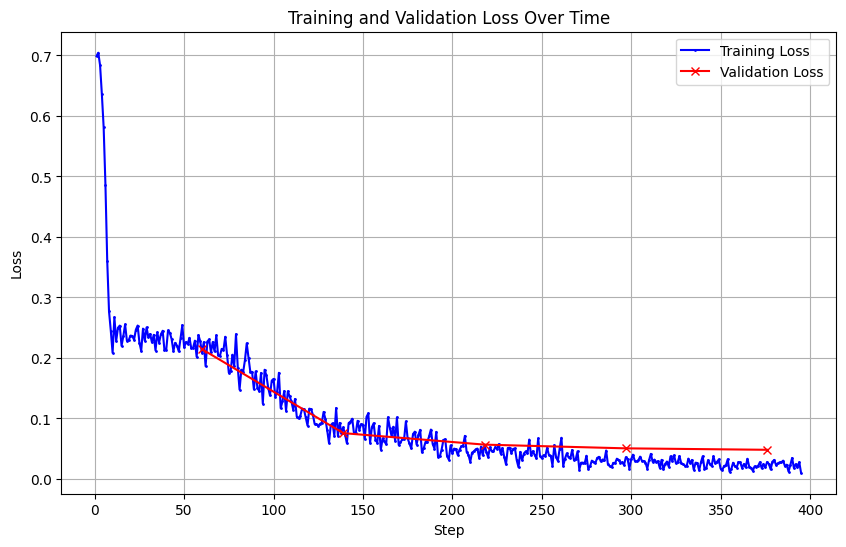

<Figure size 640x480 with 0 Axes>

In [48]:
train_steps = [x[0] for x in array_train_loss]
train_losses = [x[1] for x in array_train_loss]
val_steps = [x[0] for x in array_val_loss]
val_losses = [x[1] for x in array_val_loss]


plt.figure(figsize=(10, 6))
plt.plot(train_steps, train_losses, label='Training Loss', color='blue', marker='o', markersize=1)
plt.plot(val_steps, val_losses, label='Validation Loss', color='red', marker='x')


plt.title('Training and Validation Loss Over Time')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.legend()


plt.grid(True)
plt.show()
plt.savefig('loss_plot.png')


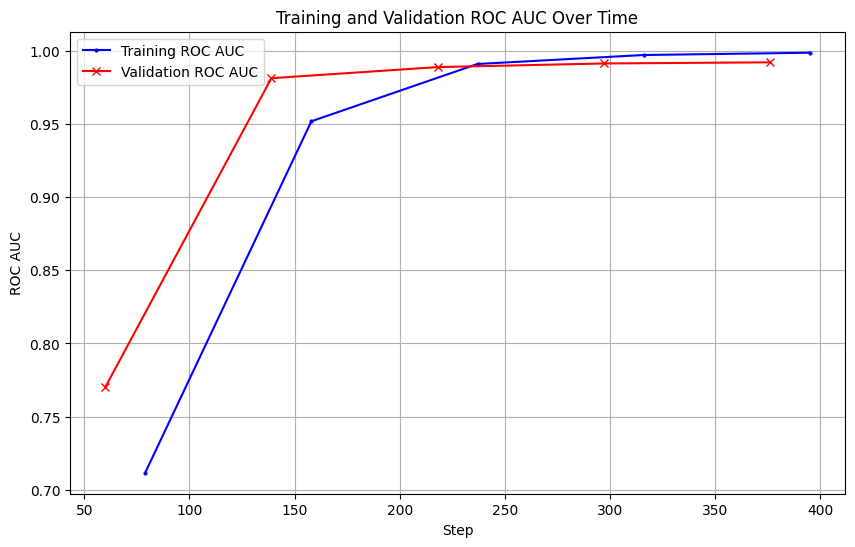

<Figure size 640x480 with 0 Axes>

In [49]:
train_steps = [x[0] for x in array_train_roc_auc]
train_roc_auc = [x[1] for x in array_train_roc_auc]

val_steps = [x[0] for x in array_val_roc_auc]
val_roc_auc = [x[1] for x in array_val_roc_auc]

plt.figure(figsize=(10, 6))

plt.plot(train_steps, train_roc_auc, label='Training ROC AUC', color='blue', marker='o', markersize=2)

plt.plot(val_steps, val_roc_auc, label='Validation ROC AUC', color='red', marker='x')

plt.title('Training and Validation ROC AUC Over Time')
plt.xlabel('Step')
plt.ylabel('ROC AUC')

plt.legend()

plt.grid(True)
plt.show()

plt.savefig('roc_auc_plot.png')


# Inference

In [30]:
dataset_valid_w_transform

Dataset({
    features: ['id', 'image', 'height', 'width', 'classes', 'objects'],
    num_rows: 2510
})

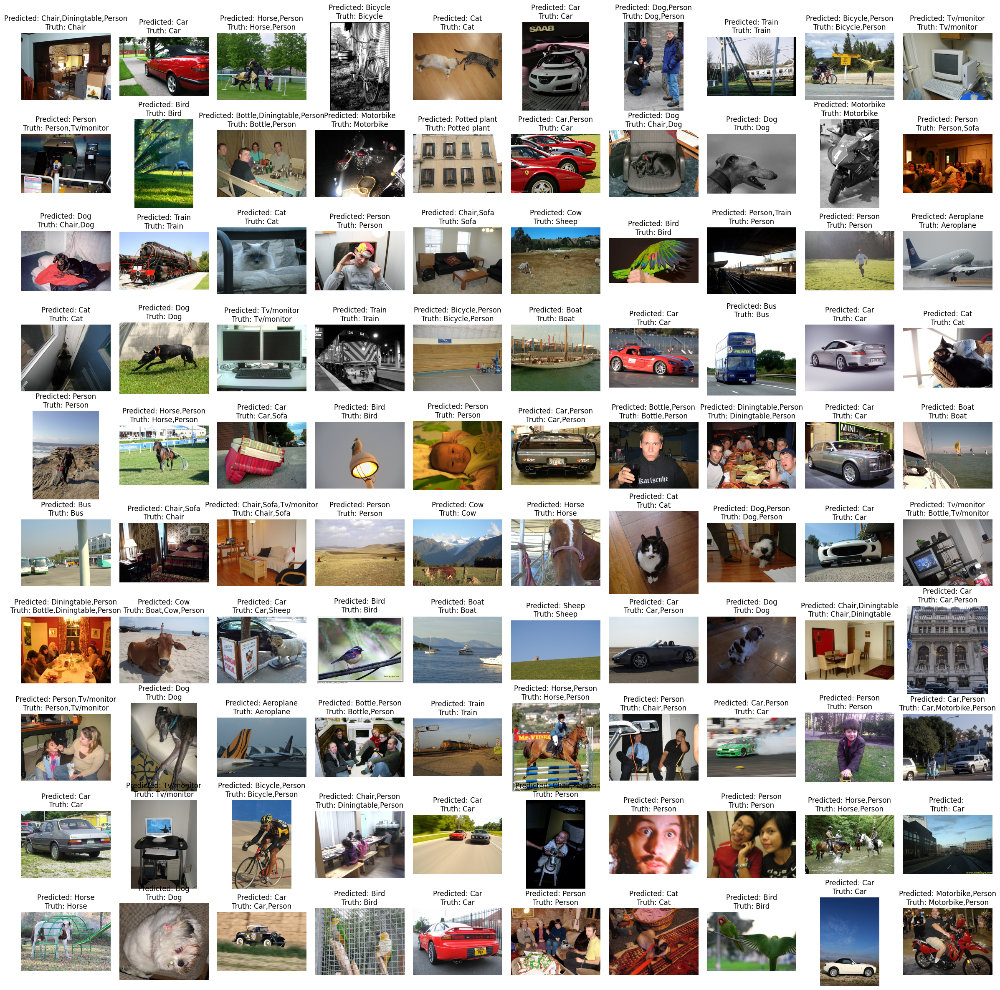

In [37]:
def show_predictions(valid_dataset, model, rows=10, cols=10, device='cuda'):
    num_to_predict = rows * cols
    #selected_set = valid_dataset.select(range(num_to_predict))
    model.eval()
    with torch.no_grad():
        logits = model(torch.stack(valid_dataset[:]["pixel_values"]).to(device))
    predictions = logits.sigmoid() > 0.5
    predicted_labels = [(','.join([id2label[class_idx] for class_idx in range(len(class_names)) if predictions[i, class_idx]]))
              for i in range(num_to_predict)]
    ground_truth_classes = [(','.join([id2label[class_idx] for class_idx in range(len(class_names)) if valid_dataset[:]["labels"][i][class_idx]]))
              for i in range(num_to_predict)]
    labels = [
        f"Predicted: {predicted_labels[i]}\nTruth: {ground_truth_classes[i]}"
        for i in range(num_to_predict)
    ]

    preview_images(valid_dataset, rows, cols, labels=labels)


show_predictions(dataset_valid_w_transform.select(range(100)), model, rows=10, cols=10, device='cuda')